In [1]:
import pandas as pd
import numpy as np
from intervaltree import Interval, IntervalTree
import torch
from torch_geometric.data import Data
from torch_geometric.utils import to_networkx
import matplotlib.pyplot as plt
import networkx as nx

In [2]:
from torch_geometric.data import DataLoader
from torch_geometric.nn import GATConv

In [3]:
# Read gene annotations
genes = pd.read_csv(
    '/Users/xxc15/Desktop/CS224W/project/data/gencode.v38.annotation.gtf.gz', sep='\t', comment='#', header=None,
    names=['chrom', 'source', 'feature', 'start', 'end', 'score', 'strand', 'frame', 'attribute']
)
genes = genes[genes['feature'] == 'gene']

# Function to extract gene_id and get the portion before the dot
def extract_gene_id(attribute):
    for item in attribute.split(';'):
        if 'gene_id' in item:
            # Extract gene_id and take the portion before the dot
            gene_id = item.strip().split(' ')[1].replace('"', '')
            return gene_id.split('.')[0]  # Get the portion before the dot
    return None

# Apply the function to extract and clean the gene_id
genes['gene_id'] = genes['attribute'].apply(extract_gene_id)


In [4]:
rnaseq = pd.read_csv(
    '/Users/xxc15/Desktop/CS224W/project/data/ENCFF103FSL.tsv', sep="\t", header=0
)
rnaseq['gene_id'] = rnaseq['gene_id'].apply(lambda x: x.split('.')[0])

In [ ]:

# rnaseq_gene_ids = set(rnaseq[rnaseq['TPM'] > 10]['gene_id'])
# genes_gene_ids = set(genes['gene_id'])
# overlap = rnaseq_gene_ids.intersection(genes_gene_ids)

In [ ]:
# unique_to_rnaseq = rnaseq_gene_ids.difference(genes_gene_ids)

In [5]:
# Define the column names
columns = [
    "chrom",       # Chromosome
    "start",       # Start coordinate
    "end",         # End coordinate
    "name",        # Name or peak ID
    "score",       # Score (0-1000)
    "strand",      # Strand (+, -, or .)
    "signal",      # Signal value (e.g., normalized read count)
    "p_value",     # -log10(p-value)
    "q_value",     # -log10(q-value)
    "summit"       # Summit position relative to start
]

# Read ATAC-seq peaks
peaks = pd.read_csv(
    '/Users/xxc15/Desktop/CS224W/project/data/ENCFF439EIO.bed.gz', sep='\t', header=None,
    names=columns
)


In [ ]:
# # Read Hi-C contacts (using loop file ENCFF050EKS)
# loop_columns = [
#  "chr1", "x1", "x2", "chr2", "y1", "y2", "name", "score",
#     "strand1", "strand2", "color", "observed", "expectedBL",
#     "expectedDonut", "expectedH", "expectedV", "fdrBL", "fdrDonut",
#     "fdrH", "fdrV", "numCollapsed", "centroid1", "centroid2", "radius"
# ]
# contacts = pd.read_csv(
#     '/Users/xxc15/Desktop/CS224W/project/data/ENCFF050EKS.bedpe.gz', sep="\t", comment="#", header=None,
#     names=loop_columns
# )


In [6]:
# Read embeddings
embeddings = np.load('/Users/xxc15/Desktop/CS224W/project/data/embeddings.npz')
embeddings_data = embeddings['embeddings']

In [7]:
from intervaltree import Interval, IntervalTree

# Create interval trees for peaks
peak_trees = {}
for chrom in peaks['chrom'].unique():
    chrom_peaks = peaks[peaks['chrom'] == chrom]
    tree = IntervalTree()
    for idx, row in chrom_peaks.iterrows():
        tree.add(Interval(row['start'], row['end'], data=idx))
    peak_trees[chrom] = tree


In [24]:
import os
import torch
from torch_geometric.data import Data
import Kamal_graph as k

# Directory to save graphs (ensure this directory exists)
graph_dir = '/Users/xxc15/Desktop/CS224W/project/graphs_visual'
os.makedirs(graph_dir, exist_ok=True)

window_size = 10_000  # Adjust the window size as desired

# For each gene
for idx, gene_row in genes.iterrows():
    gene_chrom = gene_row['chrom']
    gene_start = gene_row['start']
    gene_end = gene_row['end']
    gene_id = gene_row['gene_id']

    # Define +/-100kb region around the gene
    region_start = max(0, gene_start - 100_000)
    region_end = gene_end + 100_000

    # Get peaks within this region
    if gene_chrom in peak_trees:
        overlaps = peak_trees[gene_chrom].overlap(region_start, region_end)
        peak_indices = [interval.data for interval in overlaps]
        gene_peaks = peaks.loc[peak_indices]
    else:
        continue  # No peaks on this chromosome

    if gene_peaks.empty:
        continue  # No peaks in this region

    # Node features (embeddings)
    node_indices = gene_peaks.index.values
    node_features = embeddings_data[node_indices]

    # Mapping from peak index to node index in the graph
    peak_idx_to_node_idx = {peak_idx: i for i, peak_idx in enumerate(node_indices)}

    # Build edges based on proximity within a window
    edges = []
    # Compute midpoints
    gene_peaks['midpoint'] = (gene_peaks['start'] + gene_peaks['end']) / 2
    gene_peaks = gene_peaks.sort_values(by='midpoint')
    midpoints = gene_peaks['midpoint'].values
    peak_indices = gene_peaks.index.values

    for i, (peak_idx1, mid1) in enumerate(zip(peak_indices, midpoints)):
        node_idx1 = peak_idx_to_node_idx[peak_idx1]
        # For peaks ahead in the list (since peaks are sorted by midpoint)
        for j in range(i+1, len(midpoints)):
            peak_idx2 = peak_indices[j]
            mid2 = midpoints[j]
            if mid2 - mid1 > window_size:
                break  # Since peaks are sorted, no need to check further
            node_idx2 = peak_idx_to_node_idx[peak_idx2]
            edges.append((node_idx1, node_idx2))
            edges.append((node_idx2, node_idx1))  # Assuming undirected graph

    # Remove duplicate edges
    edges = list(set(edges))

    # Create edge_index tensor
    if edges:
        edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
    else:
        edge_index = torch.empty((2, 0), dtype=torch.long)

    # Create node feature tensor
    x = torch.tensor(node_features, dtype=torch.float)

    # Create PyG data object
    data = Data(x=x, edge_index=edge_index)
    data.gene_id = gene_id

    data = k.add_virtual_node(data)

    # Save the graph data object
    torch.save(data, f'{graph_dir}/{gene_id}.pt')



In [8]:
import os
import torch
from torch_geometric.data import Data
import Kamal_graph as k

# Directory to save graphs (ensure this directory exists)
graph_dir = '/Users/xxc15/Desktop/CS224W/project/graphs_visual_100k_30k'
os.makedirs(graph_dir, exist_ok=True)

window_size = 30_000  # Adjust the window size as desired

# For each gene
for idx, gene_row in genes.iterrows():
    gene_chrom = gene_row['chrom']
    gene_start = gene_row['start']
    gene_end = gene_row['end']
    gene_id = gene_row['gene_id']

    # Define +/-100kb region around the gene
    region_start = max(0, gene_start - 100_000)
    region_end = gene_end + 100_000

    # Get peaks within this region
    if gene_chrom in peak_trees:
        overlaps = peak_trees[gene_chrom].overlap(region_start, region_end)
        peak_indices = [interval.data for interval in overlaps]
        gene_peaks = peaks.loc[peak_indices]
    else:
        continue  # No peaks on this chromosome

    if gene_peaks.empty:
        continue  # No peaks in this region

    # Node features (embeddings)
    node_indices = gene_peaks.index.values
    node_features = embeddings_data[node_indices]

    # Mapping from peak index to node index in the graph
    peak_idx_to_node_idx = {peak_idx: i for i, peak_idx in enumerate(node_indices)}

    # Build edges based on proximity within a window
    edges = []
    # Compute midpoints
    gene_peaks['midpoint'] = (gene_peaks['start'] + gene_peaks['end']) / 2
    gene_peaks = gene_peaks.sort_values(by='midpoint')
    midpoints = gene_peaks['midpoint'].values
    peak_indices = gene_peaks.index.values

    for i, (peak_idx1, mid1) in enumerate(zip(peak_indices, midpoints)):
        node_idx1 = peak_idx_to_node_idx[peak_idx1]
        # For peaks ahead in the list (since peaks are sorted by midpoint)
        for j in range(i+1, len(midpoints)):
            peak_idx2 = peak_indices[j]
            mid2 = midpoints[j]
            if mid2 - mid1 > window_size:
                break  # Since peaks are sorted, no need to check further
            node_idx2 = peak_idx_to_node_idx[peak_idx2]
            edges.append((node_idx1, node_idx2))
            edges.append((node_idx2, node_idx1))  # Assuming undirected graph

    # Remove duplicate edges
    edges = list(set(edges))

    # Create edge_index tensor
    if edges:
        edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
    else:
        edge_index = torch.empty((2, 0), dtype=torch.long)

    # Create node feature tensor
    x = torch.tensor(node_features, dtype=torch.float)

    # Create PyG data object
    data = Data(x=x, edge_index=edge_index)
    data.gene_id = gene_id

    data = k.add_virtual_node(data)

    # Save the graph data object
    torch.save(data, f'{graph_dir}/{gene_id}.pt')

In [9]:
# Directory to save graphs (ensure this directory exists)
graph_dir = '/Users/xxc15/Desktop/CS224W/project/graphs_visual_100k_3k'
os.makedirs(graph_dir, exist_ok=True)

window_size = 3_000  # Adjust the window size as desired

# For each gene
for idx, gene_row in genes.iterrows():
    gene_chrom = gene_row['chrom']
    gene_start = gene_row['start']
    gene_end = gene_row['end']
    gene_id = gene_row['gene_id']

    # Define +/-100kb region around the gene
    region_start = max(0, gene_start - 100_000)
    region_end = gene_end + 100_000

    # Get peaks within this region
    if gene_chrom in peak_trees:
        overlaps = peak_trees[gene_chrom].overlap(region_start, region_end)
        peak_indices = [interval.data for interval in overlaps]
        gene_peaks = peaks.loc[peak_indices]
    else:
        continue  # No peaks on this chromosome

    if gene_peaks.empty:
        continue  # No peaks in this region

    # Node features (embeddings)
    node_indices = gene_peaks.index.values
    node_features = embeddings_data[node_indices]

    # Mapping from peak index to node index in the graph
    peak_idx_to_node_idx = {peak_idx: i for i, peak_idx in enumerate(node_indices)}

    # Build edges based on proximity within a window
    edges = []
    # Compute midpoints
    gene_peaks['midpoint'] = (gene_peaks['start'] + gene_peaks['end']) / 2
    gene_peaks = gene_peaks.sort_values(by='midpoint')
    midpoints = gene_peaks['midpoint'].values
    peak_indices = gene_peaks.index.values

    for i, (peak_idx1, mid1) in enumerate(zip(peak_indices, midpoints)):
        node_idx1 = peak_idx_to_node_idx[peak_idx1]
        # For peaks ahead in the list (since peaks are sorted by midpoint)
        for j in range(i+1, len(midpoints)):
            peak_idx2 = peak_indices[j]
            mid2 = midpoints[j]
            if mid2 - mid1 > window_size:
                break  # Since peaks are sorted, no need to check further
            node_idx2 = peak_idx_to_node_idx[peak_idx2]
            edges.append((node_idx1, node_idx2))
            edges.append((node_idx2, node_idx1))  # Assuming undirected graph

    # Remove duplicate edges
    edges = list(set(edges))

    # Create edge_index tensor
    if edges:
        edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
    else:
        edge_index = torch.empty((2, 0), dtype=torch.long)

    # Create node feature tensor
    x = torch.tensor(node_features, dtype=torch.float)

    # Create PyG data object
    data = Data(x=x, edge_index=edge_index)
    data.gene_id = gene_id

    data = k.add_virtual_node(data)

    # Save the graph data object
    torch.save(data, f'{graph_dir}/{gene_id}.pt')

In [10]:
# Directory to save graphs (ensure this directory exists)
graph_dir = '/Users/xxc15/Desktop/CS224W/project/graphs_visual_30k_10k'
os.makedirs(graph_dir, exist_ok=True)

window_size = 10_000  # Adjust the window size as desired

# For each gene
for idx, gene_row in genes.iterrows():
    gene_chrom = gene_row['chrom']
    gene_start = gene_row['start']
    gene_end = gene_row['end']
    gene_id = gene_row['gene_id']

    # Define +/-100kb region around the gene
    region_start = max(0, gene_start - 30_000)
    region_end = gene_end + 30_000

    # Get peaks within this region
    if gene_chrom in peak_trees:
        overlaps = peak_trees[gene_chrom].overlap(region_start, region_end)
        peak_indices = [interval.data for interval in overlaps]
        gene_peaks = peaks.loc[peak_indices]
    else:
        continue  # No peaks on this chromosome

    if gene_peaks.empty:
        continue  # No peaks in this region

    # Node features (embeddings)
    node_indices = gene_peaks.index.values
    node_features = embeddings_data[node_indices]

    # Mapping from peak index to node index in the graph
    peak_idx_to_node_idx = {peak_idx: i for i, peak_idx in enumerate(node_indices)}

    # Build edges based on proximity within a window
    edges = []
    # Compute midpoints
    gene_peaks['midpoint'] = (gene_peaks['start'] + gene_peaks['end']) / 2
    gene_peaks = gene_peaks.sort_values(by='midpoint')
    midpoints = gene_peaks['midpoint'].values
    peak_indices = gene_peaks.index.values

    for i, (peak_idx1, mid1) in enumerate(zip(peak_indices, midpoints)):
        node_idx1 = peak_idx_to_node_idx[peak_idx1]
        # For peaks ahead in the list (since peaks are sorted by midpoint)
        for j in range(i+1, len(midpoints)):
            peak_idx2 = peak_indices[j]
            mid2 = midpoints[j]
            if mid2 - mid1 > window_size:
                break  # Since peaks are sorted, no need to check further
            node_idx2 = peak_idx_to_node_idx[peak_idx2]
            edges.append((node_idx1, node_idx2))
            edges.append((node_idx2, node_idx1))  # Assuming undirected graph

    # Remove duplicate edges
    edges = list(set(edges))

    # Create edge_index tensor
    if edges:
        edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
    else:
        edge_index = torch.empty((2, 0), dtype=torch.long)

    # Create node feature tensor
    x = torch.tensor(node_features, dtype=torch.float)

    # Create PyG data object
    data = Data(x=x, edge_index=edge_index)
    data.gene_id = gene_id

    data = k.add_virtual_node(data)

    # Save the graph data object
    torch.save(data, f'{graph_dir}/{gene_id}.pt')

In [11]:
# Directory to save graphs (ensure this directory exists)
graph_dir = '/Users/xxc15/Desktop/CS224W/project/graphs_visual_300k_10k'
os.makedirs(graph_dir, exist_ok=True)

window_size = 10_000  # Adjust the window size as desired

# For each gene
for idx, gene_row in genes.iterrows():
    gene_chrom = gene_row['chrom']
    gene_start = gene_row['start']
    gene_end = gene_row['end']
    gene_id = gene_row['gene_id']

    # Define +/-100kb region around the gene
    region_start = max(0, gene_start - 300_000)
    region_end = gene_end + 300_000

    # Get peaks within this region
    if gene_chrom in peak_trees:
        overlaps = peak_trees[gene_chrom].overlap(region_start, region_end)
        peak_indices = [interval.data for interval in overlaps]
        gene_peaks = peaks.loc[peak_indices]
    else:
        continue  # No peaks on this chromosome

    if gene_peaks.empty:
        continue  # No peaks in this region

    # Node features (embeddings)
    node_indices = gene_peaks.index.values
    node_features = embeddings_data[node_indices]

    # Mapping from peak index to node index in the graph
    peak_idx_to_node_idx = {peak_idx: i for i, peak_idx in enumerate(node_indices)}

    # Build edges based on proximity within a window
    edges = []
    # Compute midpoints
    gene_peaks['midpoint'] = (gene_peaks['start'] + gene_peaks['end']) / 2
    gene_peaks = gene_peaks.sort_values(by='midpoint')
    midpoints = gene_peaks['midpoint'].values
    peak_indices = gene_peaks.index.values

    for i, (peak_idx1, mid1) in enumerate(zip(peak_indices, midpoints)):
        node_idx1 = peak_idx_to_node_idx[peak_idx1]
        # For peaks ahead in the list (since peaks are sorted by midpoint)
        for j in range(i+1, len(midpoints)):
            peak_idx2 = peak_indices[j]
            mid2 = midpoints[j]
            if mid2 - mid1 > window_size:
                break  # Since peaks are sorted, no need to check further
            node_idx2 = peak_idx_to_node_idx[peak_idx2]
            edges.append((node_idx1, node_idx2))
            edges.append((node_idx2, node_idx1))  # Assuming undirected graph

    # Remove duplicate edges
    edges = list(set(edges))

    # Create edge_index tensor
    if edges:
        edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
    else:
        edge_index = torch.empty((2, 0), dtype=torch.long)

    # Create node feature tensor
    x = torch.tensor(node_features, dtype=torch.float)

    # Create PyG data object
    data = Data(x=x, edge_index=edge_index)
    data.gene_id = gene_id

    data = k.add_virtual_node(data)

    # Save the graph data object
    torch.save(data, f'{graph_dir}/{gene_id}.pt')

Followings are illustration of graphs

/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c0000gn/T/ipykernel_67063/2678985936.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  data = torch.load(graph_file)


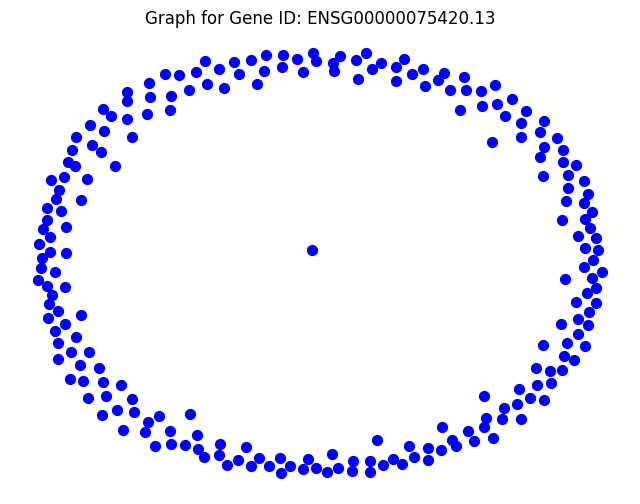

In [34]:
# Define the path to the saved graph file
graph_file = '/Users/xxc15/Desktop/CS224W/project/graphs/ENSG00000075420.13.pt'  # Replace <gene_id> with an actual gene ID

# Load the graph
data = torch.load(graph_file)

# Convert the PyG graph to a NetworkX graph
G = to_networkx(data, to_undirected=True)

# Position nodes using a layout algorithm (e.g., spring layout)
pos = nx.spring_layout(G, seed=42)

# Plot the graph
plt.figure(figsize=(8, 6))
nx.draw_networkx_nodes(G, pos, node_size=50, node_color='blue')
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title(f'Graph for Gene ID: {data.gene_id}')
plt.axis('off')
plt.show()

In [32]:
import os
graph_dir = '/Users/xxc15/Desktop/CS224W/project/graphs_linear'
os.makedirs(graph_dir, exist_ok=True)

# For each gene
for idx, gene_row in genes.iterrows():
    gene_chrom = gene_row['chrom']
    gene_start = gene_row['start']
    gene_end = gene_row['end']
    gene_id = gene_row['gene_id']

    # Define +/-100kb region around the gene
    region_start = max(0, gene_start - 100_000)
    region_end = gene_end + 100_000

    # Get peaks within this region
    if gene_chrom in peak_trees:
        overlaps = peak_trees[gene_chrom].overlap(region_start, region_end)
        peak_indices = [interval.data for interval in overlaps]
        gene_peaks = peaks.loc[peak_indices]
    else:
        continue  # No peaks on this chromosome

    if gene_peaks.empty:
        continue  # No peaks in this region

    # Node features (embeddings)
    node_indices = gene_peaks.index.values
    node_features = embeddings_data[node_indices]

    # Mapping from peak index to node index in the graph
    peak_idx_to_node_idx = {peak_idx: i for i, peak_idx in enumerate(node_indices)}

    # Filter contacts within the region
    gene_contacts = contacts[
        (contacts['chr1'] == gene_chrom) & (contacts['chr2'] == gene_chrom)
    ]
    gene_contacts = gene_contacts[
        ((contacts['x1'] >= region_start) & (contacts['x1'] <= region_end)) |
        ((contacts['x2'] >= region_start) & (contacts['x2'] <= region_end)) |
        ((contacts['y1'] >= region_start) & (contacts['y1'] <= region_end)) |
        ((contacts['y2'] >= region_start) & (contacts['y2'] <= region_end))
    ]

    # Identify edges based on Hi-C contacts
    edges = []
    for _, contact_row in gene_contacts.iterrows():
        overlaps1 = peak_trees[gene_chrom].overlap(contact_row['x1'], contact_row['x2'])
        overlaps2 = peak_trees[gene_chrom].overlap(contact_row['y1'], contact_row['y2'])
        overlaps1 = [interval.data for interval in overlaps1 if interval.data in node_indices]
        overlaps2 = [interval.data for interval in overlaps2 if interval.data in node_indices]
        for peak_idx1 in overlaps1:
            for peak_idx2 in overlaps2:
                node_idx1 = peak_idx_to_node_idx[peak_idx1]
                node_idx2 = peak_idx_to_node_idx[peak_idx2]
                if node_idx1 != node_idx2:
                    edges.append((node_idx1, node_idx2))

    # **Add edges between adjacent peaks on the same chromosome**
    # Sort the peaks by their start positions
    gene_peaks_sorted = gene_peaks.sort_values(by='start')
    sorted_peak_indices = gene_peaks_sorted.index.values
    for i in range(len(sorted_peak_indices) - 1):
        peak_idx1 = sorted_peak_indices[i]
        peak_idx2 = sorted_peak_indices[i + 1]
        node_idx1 = peak_idx_to_node_idx[peak_idx1]
        node_idx2 = peak_idx_to_node_idx[peak_idx2]
        if node_idx1 != node_idx2:
            edges.append((node_idx1, node_idx2))

    # Remove duplicate edges
    edges = list(set(edges))

    # Create edge_index tensor
    if edges:
        edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
    else:
        edge_index = torch.empty((2, 0), dtype=torch.long)

    # Create node feature tensor
    x = torch.tensor(node_features, dtype=torch.float)

    # Create PyG data object
    data = Data(x=x, edge_index=edge_index)
    data.gene_id = gene_id

    # Save the graph data object
    torch.save(data, f'{graph_dir}/{gene_id}.pt')


/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c0000gn/T/ipykernel_67063/3465753433.py:38: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gene_contacts = gene_contacts[
/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c0000gn/T/ipykernel_67063/3465753433.py:38: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gene_contacts = gene_contacts[
/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c0000gn/T/ipykernel_67063/3465753433.py:38: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gene_contacts = gene_contacts[
/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c0000gn/T/ipykernel_67063/3465753433.py:38: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gene_contacts = gene_contacts[
/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c0000gn/T/ipykernel_67063/3465753433.py:38: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gene_contacts = gene_contacts[
/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c

/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c0000gn/T/ipykernel_67063/980342124.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  data = torch.load(graph_file)


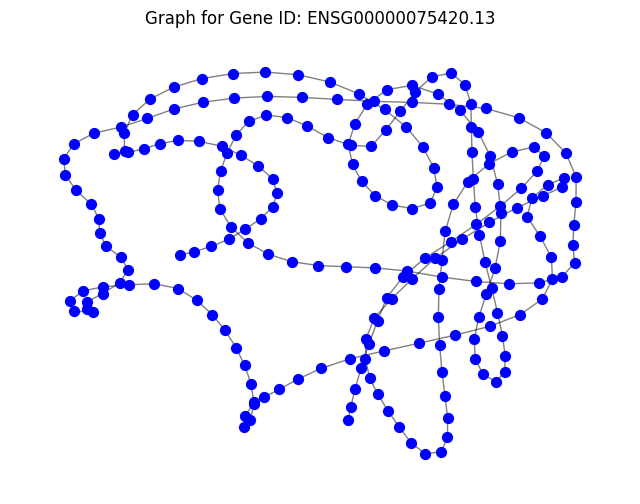

In [33]:
# Define the path to the saved graph file
graph_file = '/Users/xxc15/Desktop/CS224W/project/graphs_linear/ENSG00000075420.13.pt'  # Replace <gene_id> with an actual gene ID

# Load the graph
data = torch.load(graph_file)

# Convert the PyG graph to a NetworkX graph
G = to_networkx(data, to_undirected=True)

# Position nodes using a layout algorithm (e.g., spring layout)
pos = nx.spring_layout(G, seed=42)

# Plot the graph
plt.figure(figsize=(8, 6))
nx.draw_networkx_nodes(G, pos, node_size=50, node_color='blue')
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title(f'Graph for Gene ID: {data.gene_id}')
plt.axis('off')
plt.show()

In [39]:
data.num_node_features

512

In [ ]:
# use ENCFF103FSL for RNA seq result
# rnaseq_columns = [
#  "gene_id",	"transcript_id",	"length",	"effective_length",	"expected_count",	"TPM",	"FPKM",	"posterior_mean_count",	"posterior_standard_deviation_of_count",	"pme_TPM",	"pme_FPKM",	"TPM_ci_lower_bound",	"TPM_ci_upper_bound",	"TPM_coefficient_of_quartile_variation",	"FPKM_ci_lower_bound",	"FPKM_ci_upper_bound",	"FPKM_coefficient_of_quartile_variation"
# ]
rnaseq = pd.read_csv(
    '/Users/xxc15/Desktop/CS224W/project/data/ENCFF103FSL.tsv', sep="\t", header=0
)

/var/folders/6b/y4bf77dj2d5cnwkmbn6yqv_c0000gn/T/ipykernel_85758/3178732017.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  data = torch.load(graph_file)


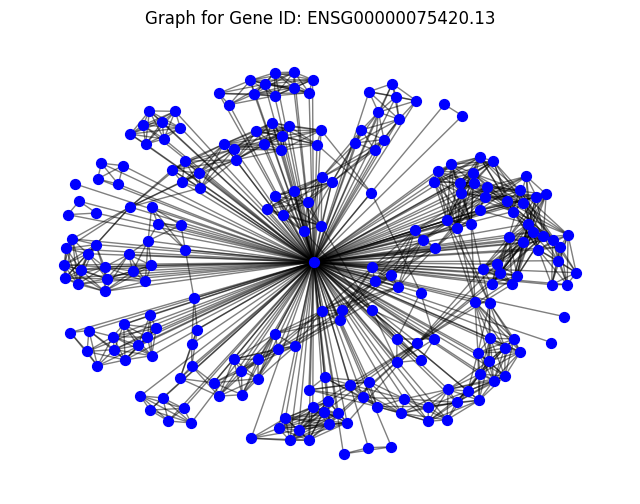

In [11]:
# Define the path to the saved graph file
graph_file = '/Users/xxc15/Desktop/CS224W/project/graphs_visual/ENSG00000075420.13.pt'  # Replace <gene_id> with an actual gene ID

# Load the graph
data = torch.load(graph_file)

# Convert the PyG graph to a NetworkX graph
G = to_networkx(data, to_undirected=True)

# Position nodes using a layout algorithm (e.g., spring layout)
pos = nx.spring_layout(G, seed=42)

# Plot the graph
plt.figure(figsize=(8, 6))
nx.draw_networkx_nodes(G, pos, node_size=50, node_color='blue')
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title(f'Graph for Gene ID: {data.gene_id}')
plt.axis('off')
plt.show()